# Singular Value Decomposition and Image Compression


<!-- [Click here to open this notebook in Colab](https://colab.research.google.com/github/williamgilpin/cphy/blob/main/talks/svd_decomp.ipynb) -->
Open this notebook in Google Colab: [![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/williamgilpin/cphy/blob/main/talks/svd_decomp.ipynb)

We start by importing the necessary Python packages.
<!-- *This notebook created by William Gilpin. Consult the [course website](https://www.wgilpin.com/cphy) for all content and [GitHub repository](https://github.com/williamgilpin/cphy) for raw files and runnable online code.* --

In [1]:
import numpy as np

# Wipe all outputs from this notebook
from IPython.display import Image, clear_output, display
clear_output(True)

# Import local plotting functions and in-notebook display functions
import matplotlib.pyplot as plt
%matplotlib inline


## Eigensystems as dominant "stretching" directions


The Spectral theorem states that if a matrix is Hermitian ($A^\dagger = A$, including real-symmetric), then: (1) The eigenvectors are an orthogonal basis, and (2) the eigenvalues are real. This is consistent with our intuition from the dynamical systems view: A "blob" of initial conditions gets anisotropically stretched at different rates along different directions. Eigenvalues are thus invariant to rotations (ie, multiplication by an orthonormal matrix)




### Why are Hermitian matrices so important?

Many physical systems arise from the minimization of a scalar potential, such as a free energy or loss function. The dynamics of such systems are described by the gradient of the potential,
$$
    \dot{\mathbf{x}} = - \nabla U(\mathbf{x})
$$
The *Jacobian matrix* of partial derivatives determines the local geometry and concavity of this scalar field, and thus stability and acceleration along various directions
$$
    J_{ij} = \frac{\partial \dot{x_i}}{\partial x_j} = - \frac{\partial^2 U}{\partial x_i \partial x_j}
$$
Dynamical systems (continuous $\dot{\mathbf{x}} = \mathbf{f}(\mathbf{x})$ or discrete $\mathbf{x}_{t} = \mathbf{f}(\mathbf{x}_{t-1})$) always have a Jacobian, but they do not necessarily have a corresponding scalar potential, which requires that the Jacobian be Hermitian. 

**The loss function in machine learning.** Often in machine learning, we need to compare to datapoints, or to compare a high-dimensional model prediction to some ground truth value. If we have two vectors $\hat{\mathbf{y}}, \mathbf{y}$, a loss function or distance function assigns a scalar value to the pair,  
$$
\mathcal{L}(\hat{\mathbf{y}}, \mathbf{y})
$$

The gradient of the loss function with respect to vector $\hat{\mathbf{y}}$ describes how much the loss function changes as we make small changes to the prediction along each dimension.

For example, we often seek to minimize the mean squared error or Euclidean distance between a vector of predictions $\hat{\mathbf{y}}$ and a vector of ground truth values $\mathbf{y}$,
$$
\mathcal{L}(\hat{\mathbf{y}}, \mathbf{y}) = (\hat{\mathbf{y}} - \mathbf{y})^T (\hat{\mathbf{y}} - \mathbf{y})
$$

The gradient of the loss function with respect to $\hat{\mathbf{y}}$ is then the signed element-wise difference between the two vectors,
$$
\nabla \mathcal{L} = 2 (\hat{\mathbf{y}} - \mathbf{y})
$$

Text(0.5, 1.0, 'Points after linear transformation - iteration 2')

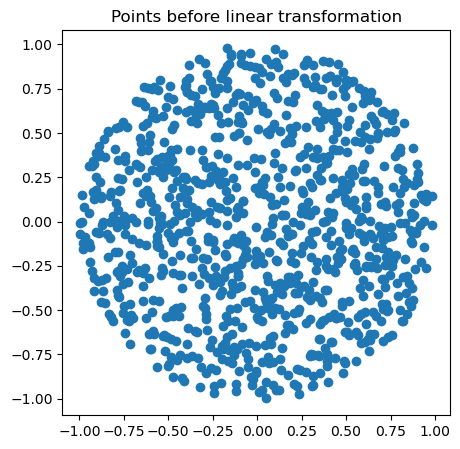

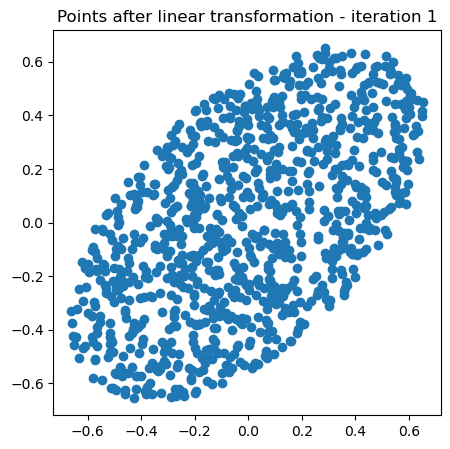

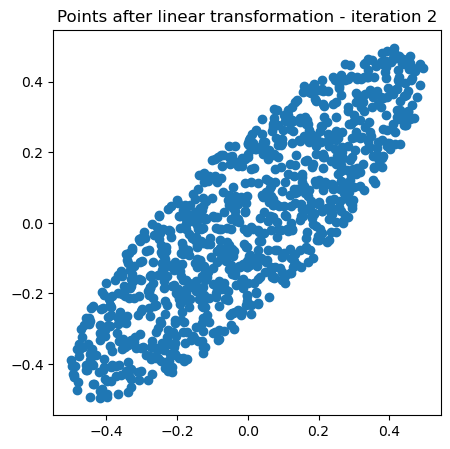

In [2]:
def random_points_disk(n, r=1):
    """Generate n random points within a disk of radius r"""
    theta = np.random.uniform(0, 2 * np.pi, n)
    r = np.sqrt(np.random.uniform(0, r**2, n)) # notice the sqrt
    x, y = r * np.cos(theta), r *  np.sin(theta)
    return np.vstack((x, y)).T



pts = np.array(random_points_disk(1000))
plt.figure(figsize=(5, 5))
plt.scatter(pts[:,0], pts[:,1])
plt.axis('equal')
plt.title("Points before linear transformation")

# # Define a random linear transformation
np.random.seed(0)
A = np.random.uniform(-1, 1, size=(2, 2)) # random 2x2 matrix with entries in [-1, 1]
A = A + A.T # symmetrize matrix to make it Hermitian

# # Apply the transformation
pts = pts @ A

plt.figure(figsize=(5,5))
plt.scatter(pts[:,0], pts[:,1])
plt.axis('equal')
plt.title("Points after linear transformation - iteration 1")

# # Apply the transformation again
pts = pts @ A

plt.figure(figsize=(5,5))
plt.scatter(pts[:,0], pts[:,1])
plt.axis('equal')
plt.title("Points after linear transformation - iteration 2")

Now let's repeat that iteration many times. We will apply our random Hermitian matrix $A$ many times to a cloud of points, and plot the result each time. 

Text(0, 0.5, 'x2')

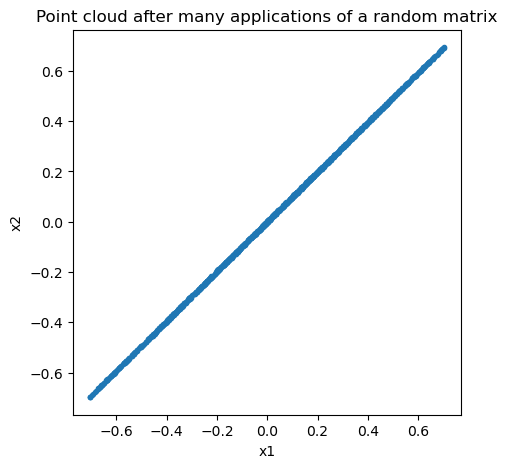

In [3]:
pts = np.array(random_points_disk(1000))
all_pts = [np.copy(pts)]
for _ in range(10):
    pts = pts @ A
    all_pts.append(np.copy(pts))

eig_vals, eig_vecs = np.linalg.eig(A)
total_scale = eig_vals[0]**10

plt.figure(figsize=(5,5))
plt.plot(pts[:, 0] / total_scale, pts[:, 1] / total_scale, '.')
plt.axis('equal')
plt.title("Point cloud after many applications of a random matrix")
plt.xlabel("x1")
plt.ylabel("x2")

We can now plot the eigenvectors of $A$, which are the directions along which the cloud is stretched.

Text(0.5, 1.0, 'Points after many linear transformations, scaled')

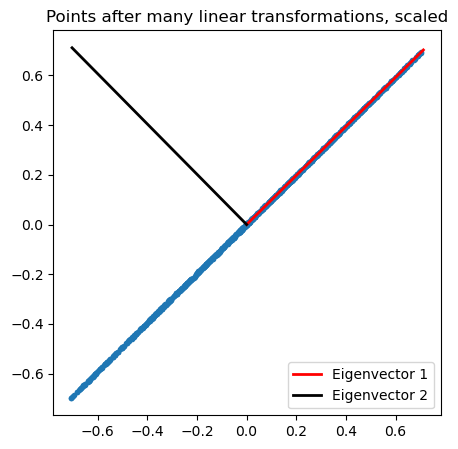

In [4]:
eig_vals, eig_vecs = np.linalg.eig(A)

plt.figure(figsize=(5,5))
plt.plot(pts[:, 0] / total_scale, pts[:, 1] / total_scale, '.')
plt.axis('equal')

eig_vec1 = eig_vecs[:, 0]
eig_vec2 = eig_vecs[:, 1]
plt.plot([0, eig_vec1[0]], [0, eig_vec1[1]], 'r', lw=2, label="Eigenvector 1")
plt.plot([0, eig_vec2[0]], [0, eig_vec2[1]], 'k', lw=2, label="Eigenvector 2")
plt.legend()
plt.title("Points after many linear transformations, scaled")

In [5]:
## Make an interactive video
from ipywidgets import interact, interactive, fixed, interact_manual, Layout
import ipywidgets as widgets

def plotter(i):
    
    total_scale = eig_vals[0]**i
    pts = all_pts[i]

    plt.figure(figsize=(5,5))
    plt.plot(pts[:, 0] / total_scale, pts[:, 1] / total_scale, '.')
    plt.plot([0, eig_vec1[0]], [0, eig_vec1[1]], 'r', lw=2)
    plt.plot([0, eig_vec2[0]], [0, eig_vec2[1]], 'r', lw=2)
    plt.show()

interact(
    plotter, 
    i=widgets.IntSlider(0, 0, 10, 1, layout=Layout(width='800px'))
)

interactive(children=(IntSlider(value=0, description='i', layout=Layout(width='800px'), max=10), Output()), _d…

<function __main__.plotter(i)>

We can see that the eigenvectors of a Hermitian matrix indeed determine the dominant stretching directions of the cloud. What about the eigenvalues? To understand their role, we can project the point cloud onto the unit vectors $\mathbf{\hat{u}}_i$ associated with the eigenvectors of $A$. Given our point cloud $X_t$ at a given time $t$, $X_t \in \mathbb{R}^{N \times 2}$, we can project it onto the unit vector $\mathbf{\hat{u}}_i$ by taking the dot product $X_t \cdot \mathbf{\hat{u}}_i$:

$$
    X \cdot \mathbf{\hat{u}}_i = \sum_{j=1}^N X_{ij} \hat{u}_{i,j}
$$

where $i,j \in \{1, 2\}$ are the row and column indices of $X$. We can plot the maximum projection of the point cloud onto each eigenvector as a function of time, in order to measure the span of the point cloud along each eigenvector direction. We can compare this sequence to the geometric series of eigenvalues associated with each eigenvector, $\lambda_i^t$.



Text(0, 0.5, 'Max span')

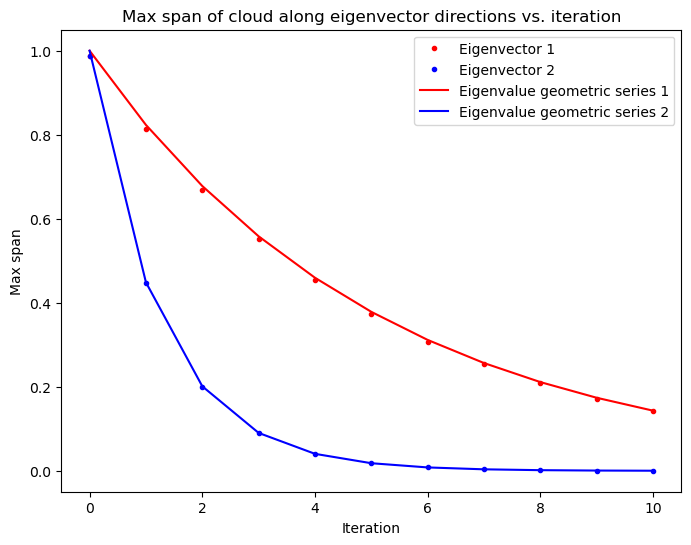

In [6]:
plt.figure(figsize=(8, 6))
plt.plot(np.max(np.array(all_pts) @ eig_vec1, axis=-1), '.r', label="Eigenvector 1")
plt.plot(np.max(np.array(all_pts) @ eig_vec2, axis=-1), '.b', label="Eigenvector 2")
plt.legend()
plt.title("Max span of cloud along eigenvector directions vs. iteration")


plt.plot(np.exp(np.log(eig_vals[0]) * np.arange(11)), color='r', label="Eigenvalue geometric series 1")
plt.plot(np.exp(np.log(-eig_vals[1]) * np.arange(11)), color='b', label="Eigenvalue geometric series 2")
plt.legend()

plt.xlabel("Iteration")
plt.ylabel("Max span")

We can see that the eigenspectrum of Hermitian matrices has a straightforward interpretation, which is partially a consequence of the spectral theorem. The eigenvectors correspond to dominant stretching directions of a cloud of points under the action of a matrix, and the eigenvalues correspond to rates of compression or stretching per iteration. In the case of non-Hermitian matrices, we will observe rotation in addition to stretching, resulting in complex-valued eigenvalues and eigenvectors.

<br>
<br>
<br>
<br>
<br>
<br>
<br>
<br>

## What about non-square matrices? Singular Value Decomposition

Suppose we have a matrix $A \in \mathbb R^{N \times M}$. For example, if we have a video of a fluid flow or sensor readings, we might have $N$ frames from $M$ sensors/pixels in each frame. If $A$ describes an algebraic system, we might have $N$ equations and $M$ unknowns, which can be overdetermined ($N > M$) or underdetermined ($N < M$). 

However, we can instead calculate the eigenspectrum of the square matrices $A^\dagger A \in \mathbb R^{M \times M}$ or $A A^\dagger \in \mathbb R^{N \times N}$. We refer to the eigenvectors as the "right" or "left" singular vectors, respectively, and their associated eigenvalues are called the *singular values.* For an $N \times M$ matrix, we have $M$ right singular vectors and $N$ left singular vectors.

Note that, when $A$ is square, $A^\dagger A$ and $A A^\dagger$ share the same eigenvalues. To see this, let $\mathbf{x}$ be an eigenvector of $A^\dagger A$ with corresponding eigenvalue $a$. $A^\dagger A \mathbf{x} = a \mathbf{x} \implies A A^\dagger A \mathbf{x} = a \mathbf{x}$. Consequently, $a$ is also an eigenvalue of $A A^\dagger$ with corresponding eigenvector $A \mathbf{x}$.

For a non-square $A$, we can factorize $A$ as
$$
    A = U \Sigma V^\dagger
$$
where the columns of $U \in \mathbb R^{N \times N}$ are the right singular vectors, the columns of $V \in \mathbb R^{M \times M}$ are the left singular vectors, and $\Sigma \in \mathbb R^{N \times M}$ is a square diagonal matrix. The non-zero entries of $\Sigma$ are the square roots of the non-zero eigenvalues of $A^\dagger A$ or $A A^\dagger$. Since the eigenvalues and eigenvectors can be listed in any order, by convention we normally list the elements in descending order of eigenvalue magnitude, $|\sigma_i| \geq |\sigma_{i+1}|$.

The singular vectors decompose a dataset into characteristic directions in rowspace (left eigenvectors) and characteristic directions in columnspace (right eigenvectors).Importantly, unlike traditional eigenvalue decomposition, SVD applies to non-square matrices. Depending on the context, the singular vectors have different interpretations, including (1) Geometric, (2) Dynamical, (3) Data compression, pattern discovery


+ See image below from Chris Rycroft's AM205 class

<img src="../resources/svd_pic.png" style="max-width:40%; height:auto;">


<br>
<br>
<br>
<br>
<br>
<br>
<br>

The singular values $\sigma_i$ are the square roots of the eigenvalues of either $A^\dagger A$ or $A A^\dagger$. Because $A^\dagger A$ or $A A^\dagger$ are both symmetric matrices, the spectral theorem ensures that the singular values are always real and non-negative, and so are usually indexed so that they are listed in descending order, $\sigma_1 \geq \sigma_2 \geq \cdots \geq \sigma_k$.

The left singular vectors $U = \{\mathbf{u}_i\}$ are the eigenvectors of $A^\dagger A$. They are orthogonal unit vectors. The right singular vectors $V = \{\mathbf{v}_i\}$ are the eigenvectors of $A A^\dagger$. They are preimages of the $U$ vectors, so that $A \mathbf{v}_i = \sigma_i \mathbf{u}_i$. They are also orthogonal unit vectors.

### Truncated versus full SVD

In full SVD, we calculate all $N$ singular values and vectors, and the matrices $U$ and $V$ are square with dimensions $N \times N$ and $M \times M$, respectively, while the matrix $\Sigma$ is rectangular with dimensions $N \times M$. In truncated SVD, we calculate only the first $k$ singular values and vectors associated with the largest singular values $\sigma_i$,

We define the truncated matrices $\tilde U$ of size $N \times k$, $\tilde \Sigma$ of size $k \times k$. $V$ still has size $M \times M$. The truncated SVD often approximates the original matrix $A$ well, making it useful for data compression and dimensionality reduction.

$$
    A = U \Sigma V^\dagger \approx \tilde U \tilde \Sigma V^\dagger
$$


<img src="https://raw.githubusercontent.com/williamgilpin/cphy/main/resources/full_reduced_svd.png" style="max-width:50%; height:auto;">

*Image from from Chris Rycroft's AM205 class*


<br>
<br>
<br>
<br>
<br>
<br>
<br>



# Dynamical systems interpretation of SVD

In dynamical systems, we might have skew-product structure, where the dynamics of some variables depend only on a subset of the others
$$
\begin{cases} 
      x_{t + 1} \!&=& 4 x_t + y_t + 3 z_t \\
      y_{t + 1} \!&=& x_t + 2 y_t + 2 z_t \\
     z_{t + 1} \!&=& f(z_t, t)
   \end{cases}
$$

Examples: $f(z_t) = z_t + c$ is a a time like variable,  $f(z_t) = \eta$ is a random number generator (like we saw for the Ornstein-Uhlenbeck simulation); $f(z_t) = \sin(\omega t)$ is a periodic driver.

Can write this system has rectangular structure
$$
\begin{bmatrix}
x_{t+1}\\
y_{t+1}
\end{bmatrix}
= 
\begin{bmatrix}
4 & 1 & 3\\
1 & 2 & 2 
\end{bmatrix}
\begin{bmatrix}
x_{t}\\
y_{t} \\ 
z_{t}
\end{bmatrix}
$$
Our analogy to square matrix dynamics is now a bit more involved, because we can't iterate the system repeatedly without knowing the sequence of $z_t$ values. Notice that if the coupling to the $z$ driver system is zero, then our square "response" subsystem represents an autonomous linear system with Hermitian structure: $x$ affects $y$ as much as $y$ affects $x$,
$$
\begin{bmatrix}
x_{t+1}\\
y_{t+1}
\end{bmatrix}
= 
\begin{bmatrix}
4 & 1 \\
1 & 2 
\end{bmatrix}
\begin{bmatrix}
x_{t}\\
y_{t} 
\end{bmatrix}
$$


When $z \ne 0$, we cannot do any spectral analysis anymore, because our coefficient matrix $A \in \mathbb{R}^{2 \times 3}$. However, we can instead analyze the two square matrices $AA^\dagger \in \mathbb{R}^{2 \times 2}$ and $A^\dagger A \in \mathbb{R}^{3 \times 3}$. This is like analyzing two iterations of a square dynamical system.






In [7]:

a_response = np.array([[4, 1], [1, 2]]).T
print("Two iterations of square response subsystem without driving:")
print(a_response @ a_response.T, end='\n\n')
# print(a_response.T @ a_response, end='\n\n')

# Decoupled limit
a_full = np.array([[4, 1, 0], [1, 2, 0]]).T
print("Left matrix product with zero driving:")
print(a_full @ a_full.T, end='\n\n')
# print(a_full.T @ a_full, end='\n\n')


# Coupled limit
print("Left matrix product with driving:")
a_full = np.array([[4, 1, 3], [1, 2, 2]]).T
print(a_full @ a_full.T, end='\n\n')


Two iterations of square response subsystem without driving:
[[17  6]
 [ 6  5]]

Left matrix product with zero driving:
[[17  6  0]
 [ 6  5  0]
 [ 0  0  0]]

Left matrix product with driving:
[[17  6 14]
 [ 6  5  7]
 [14  7 13]]



Loosely, the left matrix represents the propagation of an impulse in $z$ across the response subsystem (coupling of dynamical variables to the driver. This tells us about the dependence of response variables on earlier values

In [8]:

a_response = np.array([[4, 1], [1, 2]]).T
print("Two iterations of transpose of square response subsystem without driving:")
print(a_response.T @ a_response, end='\n\n')
# print(a_response.T @ a_response, end='\n\n')


# Decoupled limit
a_full = np.array([[4, 1, 0], [1, 2, 0]]).T
print("Right matrix product with zero driving:")
print(a_full.T @ a_full, end='\n\n')
# print(a_full.T @ a_full, end='\n\n')


# Coupled limit
print("Right matrix product with driving:")
a_full = np.array([[4, 1, 3], [1, 2, 2]]).T
print(a_full.T @ a_full, end='\n\n')

Two iterations of transpose of square response subsystem without driving:
[[17  6]
 [ 6  5]]

Right matrix product with zero driving:
[[17  6]
 [ 6  5]]

Right matrix product with driving:
[[26 12]
 [12  9]]



Loosely, the right matrix tells us about the driver system. If the driver couplings have the form $b = [3, 2]$, then the right matrix is perturbed by elementwise-adding the structured matrix $b b^T$ to the right matrix. The diagonal elements tell us something about how much the different dynamical variables are affected. This interpretation is reminiscent of the density matrix of mixed quantum systems.


In [9]:
bias = np.array([2, 3])[:, None]
print(bias @ bias.T, end='\n\n')

[[4 6]
 [6 9]]



In [10]:
print(a_full.T @ a_full - a_response.T @ a_response, end='\n\n')

[[9 6]
 [6 4]]



## Data representation and compression views

We consider the case where $A \in \mathbb R^{N \times M}$ is a data matrix, describing  $N$ observations of an $M$ dimensional process. Examples include a video ($N$ is number of frames, $M$ is number of pixels), or a collection of $N$ points in $3D$ space ($M = 3$). The left eigenvectors give characteristic "modes" in the data; they have the same dimensionality. The right eigenvectors give us the characteristic "loadings" onto those modes. SVD can thusbe used to reduce the dimensionality of a problem by truncating relevant eigenvalues; a basic compression method for high-dimensional data. The decay of the singular values provides a clue into the intrinsic dimensionality of the underlying data generating process.

<br>
<br>
<br>
<br>
<br>
<br>
<br>

### Application: Image compression

The SVD of an image can be used to compress the image by truncating the sum over singular values and vectors. Recall that the SVD of a matrix $A$ is given by

$$ A = U \Sigma V^\dagger $$

We can verify that this decomposition is valid by reconstructing the original matrix $A$ from its SVD components. 

Image shape is (372, 248)


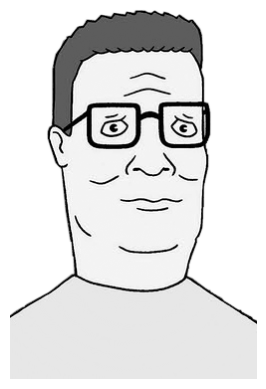

In [11]:
from PIL import Image as img

## Local import to open the image
# im = img.open("../resources/hank.png")

## Fetch image from online hosting
import requests
from io import BytesIO
url = "https://raw.githubusercontent.com/williamgilpin/cphy/main/resources/hank.png"
response = requests.get(url)
im = img.open(BytesIO(response.content))

# convert to a numpy image using just the red channel
im = np.array(im)[..., 0]
print("Image shape is", im.shape)
plt.imshow(im, cmap='gray')
plt.axis('off');

Numpy's SVD solver returns the matrices $U, S, V^\dagger$. We use a keyword argument `full_matrices=False` to request reduced SVD, which returns $U$ with shape $N \times \min(N, M)$, $S$ with shape $\min(N, M)$, and $V^\dagger$ with shape $\min(N, M) \times M$. We can convert the vector $S$ to a diagonal matrix $\Sigma$ using the `np.diag` function. 

Note that Numpy returns $V^\dagger$ directly, and so we do not need to transpose it when we compute the reconstruction.

U shape is (372, 248)
s shape is (248,)
V shape is (248, 248)


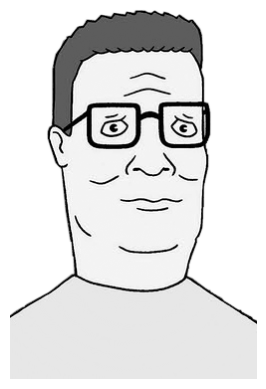

In [12]:
# Perform SVD on the image

U, s, V = np.linalg.svd(im, full_matrices=False)
sigma = s * np.eye(len(s))

# im = U @ sigma @ V.T

# im = U @ np.diag(s) @ V.T
print("U shape is", U.shape)
print("s shape is", s.shape)
print("V shape is", V.shape)

plt.imshow(U @ np.diag(s) @ V, cmap='gray')
plt.axis('off');

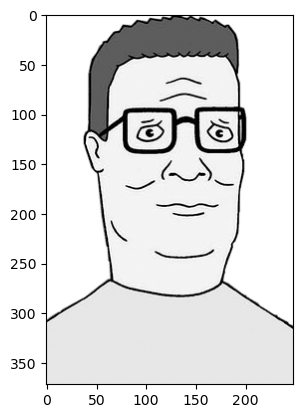

In [ ]:
plt.imshow(U @ np.diag(s) @ V, cmap='gray')

SVD applies to any rectangular matrix. If $A$ corresponds to an $N \times M$ image, we can reconstruct individual images by treating them as collections of columns, and reconstructing by adding together subsets of characteristic columns,

$$
    A = \sum_i \sigma_i \mathbf{u}_i \mathbf{v}_i^\dagger
$$

We can also truncate this sum at some $k < \text{min}(N, M)$in order to approximate the matrix $A$ instead.

If the singular values decay rapidly, then we can approximate the matrix by truncating this sum to the first $k$ terms

Us shape is (372, 50)
ss shape is (50, 50)
Vs shape is (50, 248)
Approximation shape is (372, 248)


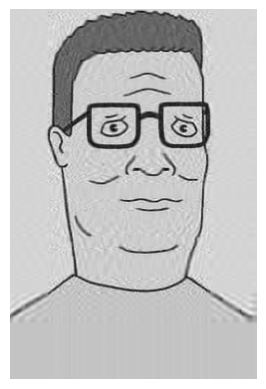

In [ ]:
Us = U[:, :50]
ss = np.diag(s[:50])
Vs = V[:50, :]
print("Us shape is", Us.shape)
print("ss shape is", ss.shape)
print("Vs shape is", Vs.shape)

im_approx = Us @ ss @ Vs
print("Approximation shape is", im_approx.shape)
plt.imshow(im_approx, cmap='gray')
plt.axis('off');

We can now try varying the number of terms $k$ that we retain in the sum, and see how well we can reconstruct the original image.

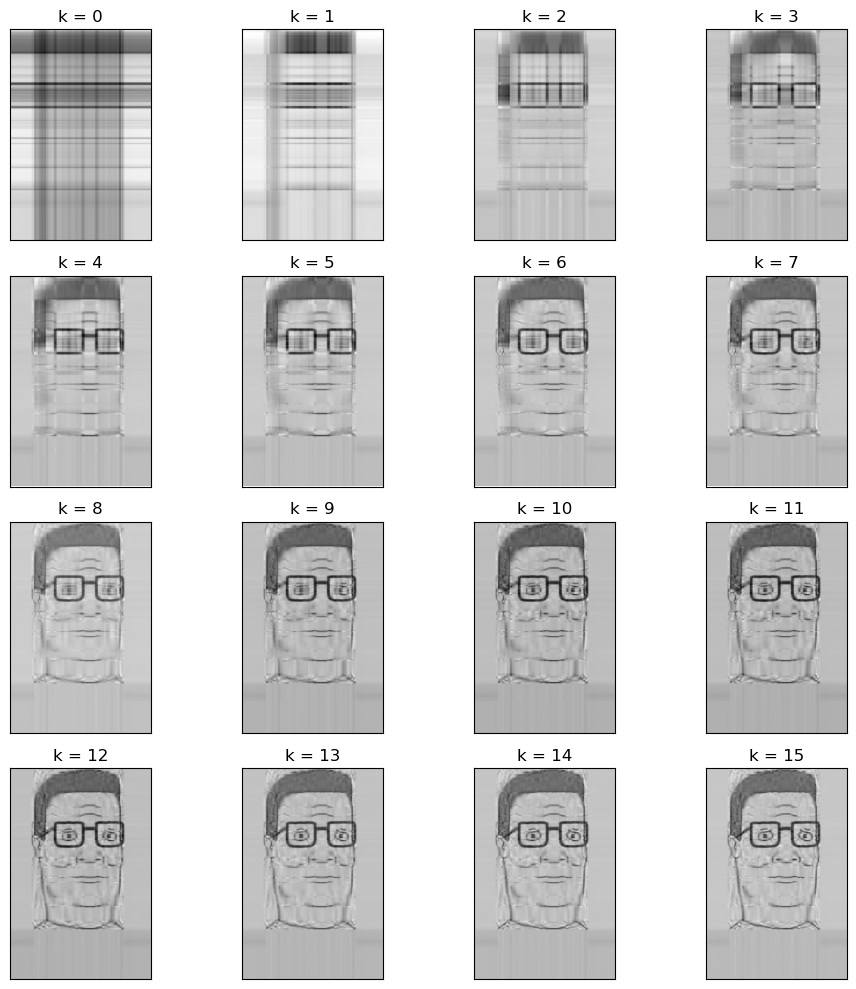

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

### make a grid of 5 x 5 subplots
fig, axs = plt.subplots(4, 4, figsize=(10, 10))
for i in range(16):
    im_approx =  U[:, :i+1] @ np.diag(s[:i+1]) @ V[:i+1, :]
    axs[i//4, i%4].imshow(im_approx, cmap='gray')
    axs[i//4, i%4].set_title(f"k = {i}")
    axs[i//4, i%4].set_xticks([])
    axs[i//4, i%4].set_yticks([])
plt.tight_layout()
plt.show()

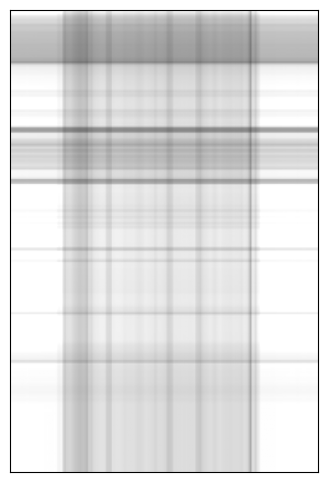

In [ ]:
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Assuming frames is a numpy array with shape (num_frames, height, width)
# frames = np.array(model.history).copy() 

fig = plt.figure(figsize=(6, 6))
img = plt.imshow(U[:, :1] @ np.diag(s[:1]) @ V[:1, :], vmin=np.min(im), vmax=np.max(im), cmap="gray");
plt.xticks([]); plt.yticks([])
# tight margins
plt.margins(0,0)
plt.gca().xaxis.set_major_locator(plt.NullLocator())

frames = [U[:, :i] @ np.diag(s[:i]) @ V[:i, :] for i in range(1, 60)]
def update(frame):
    img.set_array(frame);

ani = FuncAnimation(fig, update, frames=frames, interval=50)
HTML(ani.to_jshtml())

We can directly look at the singular value distribution, to see if it matches our expectation based on the images.

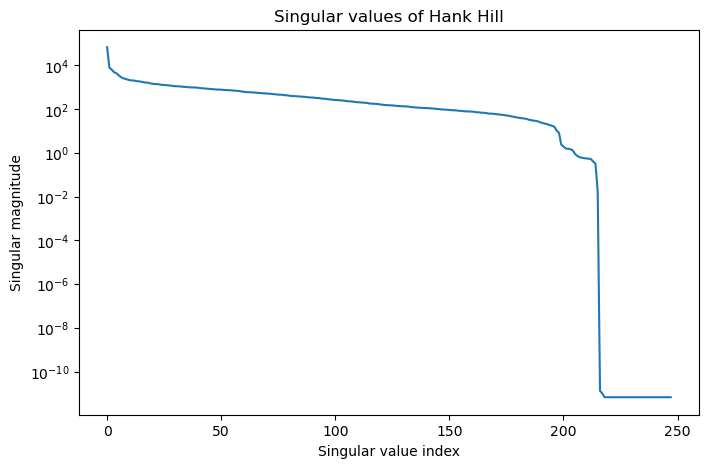

In [ ]:
plt.figure(figsize=(8, 5))
plt.semilogy(s)
plt.xlabel("Singular value index");
plt.ylabel("Singular magnitude");
plt.title("Singular values of Hank Hill");

## Density matrices and product states

From our image compression example, we can see that we can approximate a matrix by a sum over rank-1 (outer product) matrices

$$
A = \sigma_1 \mathbf{u}_1 \otimes \mathbf{v}_1 + \sigma_2 \mathbf{u}_2 \otimes \mathbf{v}_2 + ...
$$
where the sum is over all singular values and vectors. 

For a Hermitian matrix, $A = A^\dagger$, we can instead write this as a sum over rank-1 matrices with the same vector in both slots
$$
A = \lambda_1 \mathbf{u}_1 \otimes \mathbf{u}_1 + \lambda_2 \mathbf{u}_2 \otimes \mathbf{u}_2 + ...
$$

where the $\mathbf{u}_i$ are orthonormal eigenvectors and $\lambda_i$ are the corresponding eigenvalues.

Recall that, in quantum mechanics, that if we have a system with "pure" eigenstates $\Phi^\dagger \equiv \{\phi_i\}_N$, then we can define the density matrix for a given mixed state as
$$
\rho = \sum_{i} p_i \, \phi_i \otimes \phi_i
$$

We can see truncated SVD is equivalent to approximating $\rho$ by only including the most-probable terms with largest $|s_i|$ (up to a renormalization), thus removing rare states.

<br>
<br>
<br>
<br>
<br>
<br>
<br>


<!-- 
### A connection to quantum mechanics

In QM, we might have a quantum system spanned by the basis set $\{\phi_i^{(S)}\}_N$ and an environment spanned by the basis set $\{\phi_j^{(E)}\}_M$. A given system state can be written as a linear combination of system eigenvectors $S = s_1 \phi_1^{(S)} + s_2 \phi_2^{(S)} + ...$ and a given environment state may be written as $E = s_1 \phi_1^{(E)} + s_2 \phi_2^{(E)} + ...$

If the system and environment are not entangled, we can find the combined system-environment by taking the outer product $\Psi = S \otimes E$, which represents combinations of system and environment states.
$$
\Psi = \sum_{ij} s_i e_j \phi_i^{(S)} \otimes \phi_i^{(E)}
$$
If the system and environment are entangled, then the matrix no longer factors and we instead have
$$
\Psi = \sum_{ij} w_{ij} \phi_i^{(S)} \otimes \phi_j^{(E)}
$$ -->



<!-- The density matrix of a quantum mechanical system with eigenbasis $\Psi^\dagger \equiv \{\psi_i\}_N$ is given by the outer product of the basis
$$
\rho \equiv \Psi \Psi^\dagger
$$


Recall that the expectation value of an arbitrary operator $A$ is given by
$$
\langle A \rangle = 
$$ -->

# The Moore-Penrose pseudoinverse

Suppose we have an overdetermined system of equations
$$
    A \mathbf{x} = \mathbf{b}
$$
where $A \in \mathbb{R}^{N \times M}$, $\mathbf{x} \in \mathbb{R}^M$, and $\mathbf{b} \in \mathbb{R}^N$. If the number of rows is greater than the number of columns ($N > M$), then we have more equations than unknowns, and the system is overdetermined. In this case, it is likely that no $\mathbf{x}$ exists that satisfies $A \mathbf{x} = \mathbf{b}$ exactly. However, we can instead seek the "best" solution in the sense of minimizing the squared error $||A \mathbf{x} - \mathbf{b}||^2$.


### Deriving the pseudoinverse

We write the rectangular matrix $A$ in terms of its singular value decomposition
$$
    U \Sigma V^\dagger \mathbf{x} = \mathbf{b}
$$
where, $U \in \mathbb{R}^{N \times N}$, $\Sigma \in \mathbb{R}^{N \times M}$, and $V \in \mathbb{R}^{M \times M}$. We multiply both sides by $U^\dagger \in \mathbb{R}^{N \times N}$ and note that $U^\dagger U = I$, producing the equation

$$
    \Sigma V^\dagger \mathbf{x} = U^\dagger \mathbf{b}
$$

We next define the pseudoinverse of $\Sigma$, denoted by $\Sigma^+ \in \mathbb{R}^{M\times N}$, as the matrix with the same dimensions as $\Sigma$ that has the reciprocal of each non-zero element along the primary diagonal, and zeros everywhere else. Note that this pseudoinverse has a shape that is transposed relative to $\Sigma$. This pseudoinverse has the property that $\Sigma^+ \Sigma = I \in \mathbb{R}^{M \times M}$. However, $\Sigma \Sigma^+ \neq I \in \mathbb{R}^{N \times N}$.

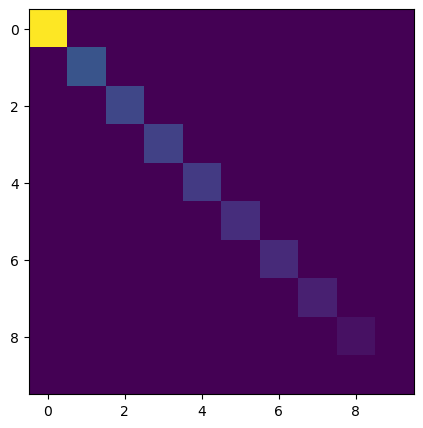

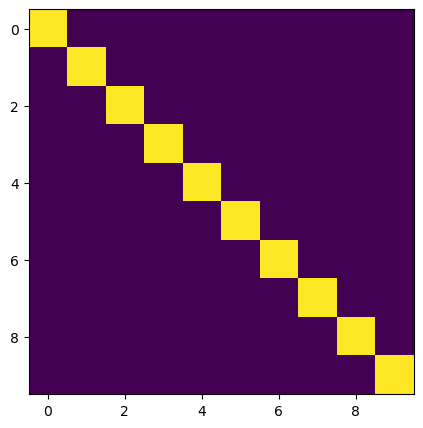

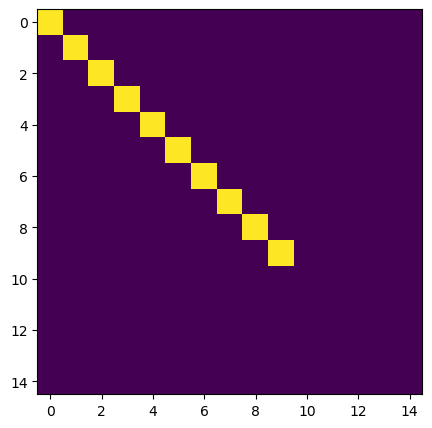

In [ ]:
a = np.random.rand(10, 10)
## pad with zeros to make it rectangular
a = np.pad(a, ((0, 5), (0, 0)), mode='constant')

plt.figure(figsize=(5, 5))
plt.imshow(a)
u, s, v = np.linalg.svd(a)
s = np.diag(s)
plt.imshow(s)

plt.figure(figsize=(5, 5))
plt.imshow(np.linalg.pinv(a) @ a)

plt.figure(figsize=(5, 5))
plt.imshow(a @ np.linalg.pinv(a))


Our previous expression was

$$
    \Sigma V^\dagger \mathbf{x} = U^\dagger \mathbf{b}
$$

We multiply both sides of our expression above by $\Sigma^+$ to get

$$
    V^\dagger \mathbf{x} = \Sigma^+ U^\dagger \mathbf{b}
$$

We can then multiply both sides by $V$ to get

$$
    \mathbf{x} = V \Sigma^+ U^\dagger \mathbf{b}
$$

We can then define the pseudoinverse $A^+$ of a rectangular matrix $A$ as
$$
    A^+ = V \Sigma^+ U^\dagger
$$

$$
    A = U \Sigma V^\dagger
$$

$$
    A^+ A = V \Sigma^+ U^\dagger U \Sigma V^\dagger
$$


To understand the pseudoinverse, we consider the case where $N$ is greater than $M$, so that $A$ is overdetermined. 

In [ ]:
# 1000 samples, 10 features
# 1000 equations/constraints, 10 unknowns

m, n = 15, 150
# m, n = 150, 15

A = np.random.normal(size=(m, n)) 
b = np.random.normal(size=(m, 1))


# A = np.random.normal(size=(15, 100)) 
# b = np.random.normal(size=(15, 1))


In [ ]:
## Compute the Least Squares solution

def moore_penrose(A):
    U, S, Vt = np.linalg.svd(A, full_matrices=False)
    S_inv = np.zeros(S.shape)
    
    # Calculate reciprocal of non-zero singular values
    non_zero = S > 1e-15  # Identify non-zero singular values
    S_inv[non_zero] = 1 / S[non_zero]
    
    # Compute pseudoinverse
    A_pseudo = Vt.T @ np.diag(S_inv) @ U.T
    return A_pseudo

# A @ x = b

# A @ x - b

x = moore_penrose(A) @ b


Within the $min(M,N)$ subspace associated with the $M$ columns of $A$, the pseudotinverse is self-adjoint, $A^+ = A^\dagger$ and so $A^+ A = I$.

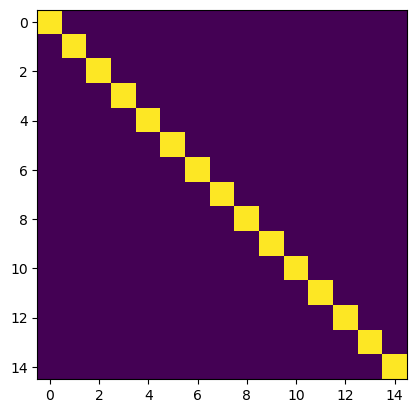

In [ ]:
plt.imshow(moore_penrose(A)  @  A)

In [ ]:
plt.plot(b, A @ x, '.') # plot the data

ValueError: matmul: Input operand 1 has a mismatch in its core dimension 0, with gufunc signature (n?,k),(k,m?)->(n?,m?) (size 15 is different from 150)

# Appendix

In [ ]:
## Make an interactive video of Hank's face
from ipywidgets import interact, interactive, fixed, interact_manual, Layout
import ipywidgets as widgets

def plotter(i):
    
    Us = U[:, :i]
    ss = np.diag(s[:i])    
    Vs = V[:i, :]

    im_approx = Us @ ss @ Vs
    plt.imshow(im_approx, cmap='gray')
    plt.show()

interact(
    plotter, 
    i=widgets.IntSlider(0, 1, V.shape[0], 1, layout=Layout(width='800px'))
)

interactive(children=(IntSlider(value=1, description='i', layout=Layout(width='800px'), max=248, min=1), Outpu…

<function __main__.plotter(i)>